## Imports

In [1]:
%load_ext autoreload
%autoreload 2

# Standard imports
import glob

# 3rd party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np 
from pprint import pprint
import SimpleITK as sitk

## Functions

In [2]:
def read_tif(filepath):
    """
    Read tiff files using SimpleITK
    
    Args:
        filepath: str, path to tiff file
        
    Returns:
        image: np.ndarray, tiff image
    """
    image = sitk.ReadImage(filepath)
    image = sitk.GetArrayFromImage(image)
    return image


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def gamma_correction(image: np.ndarray, gamma: float=2.0) -> np.ndarray:
    """
    Apply gamma correction to the image.
    
    Args:
        image: np.ndarray, input image
        gamma: float, gamma value
        
    Returns:
        image_enhanced: np.ndarray, gamma corrected image
    """
    # Normalize the image to the range [0, 1]
    image_normalized = image / image.max()
    # Apply the exponential transformation
    image_enhanced = np.power(image_normalized, gamma)
    # Rescale the image back to the original intensity range
    image_enhanced = image_enhanced * image.max()
    return image_enhanced


def compute_average_image(images):
    """
    Compute the average image from a list of images.
    
    Args:
        images: list, list of images
        
    Returns:
        average_image: np.ndarray, average image
    """
    average_image = np.mean(images, axis=0)
    return average_image


def show_4(original_image, contrast_enhanced, thresholded, xlim=None, ylim=None):
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original zoomed")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 2)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.title("Contrast enhanced")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 3)
    plt.imshow(thresholded, cmap='gray')
    plt.title("Thresholded")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 4)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.contour(thresholded, colors='red', linewidths=0.5, alpha=0.35)
    plt.title("Contrast enhanced + contour")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])
    plt.show()
    
    
def save_figure(image, filename, contours=None):
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='gray')
    if contours is not None:
        plt.contour(contours, colors='red', linewidths=0.15, alpha=0.35)
    plt.axis('off')
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    print(f"Saved figure to {filename}")

## Load data

In [3]:
data_folder_path = "data/ch0/"
start_idx = 5
end_idx = start_idx + 10

# Read all tif files in the folder
data_files = sorted(glob.glob(data_folder_path + "*.tif"))
pprint(data_files[start_idx:end_idx])
images = [read_tif(filepath) for filepath in data_files[start_idx:end_idx]]

['data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1303_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1304_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1305_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1306_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1307_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1308_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '

TIFFReadDirectory: Warning, Unknown field with tag 65000 (0xfde8) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65001 (0xfde9) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65002 (0xfdea) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65003 (0xfdeb) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65004 (0xfdec) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65005 (0xfded) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65006 (0xfdee) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65007 (0xfdef) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65008 (0xfdf0) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65000 (0xfde8) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65001 (0xfde9) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65002 (0xfdea) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 6

## Stats and histogram

Image shape: (14233, 12249)
Image type: uint16
Image min: 0
Image max: 7055
Image mean: 375.42261170021567
Image median: 423.0
Image std: 234.27123795250063
Image mean + 3 std: 1078.2363255577175
Image mean + 2 std: 843.9650876052169
Image mean + 1 std: 609.6938496527163
Image mean - 1 std: 141.15137374771504
Image mean - 2 std: -93.11986420478559
Image mean - 3 std: -327.3911021572862


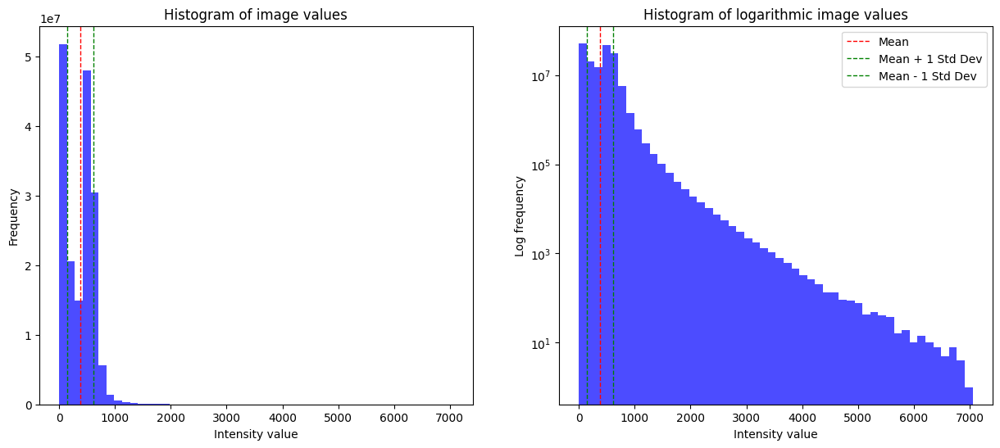

In [4]:
curr_img = images[0]

# Show statistics of the image
image_min = curr_img.min()
image_max = curr_img.max()
image_mean = curr_img.mean()
image_median = np.median(curr_img)
image_std = curr_img.std()

print("Image shape:", curr_img.shape)
print("Image type:", curr_img.dtype)
print("Image min:", image_min)
print("Image max:", image_max)
print("Image mean:", image_mean)
print("Image median:", image_median)
print("Image std:", image_std)
print("Image mean + 3 std:", image_mean + 3 * image_std)
print("Image mean + 2 std:", image_mean + 2 * image_std)
print("Image mean + 1 std:", image_mean + image_std)
print("Image mean - 1 std:", image_mean - image_std)
print("Image mean - 2 std:", image_mean - 2 * image_std)
print("Image mean - 3 std:", image_mean - 3 * image_std)

# Plot histogram of image values
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.hist(curr_img.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Histogram of image values")
plt.xlabel("Intensity value")
plt.ylabel("Frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')  # Add lines for mean and standard deviation
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Second plot with log scale
plt.subplot(1, 2, 2)
plt.hist(curr_img.flatten(), bins=50, color='blue', alpha=0.7)
plt.yscale('log')
plt.title("Histogram of logarithmic image values")
plt.xlabel("Intensity value")
plt.ylabel("Log frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')

# Add legend
plt.legend()
plt.show()

Apply exponential scaling on the image

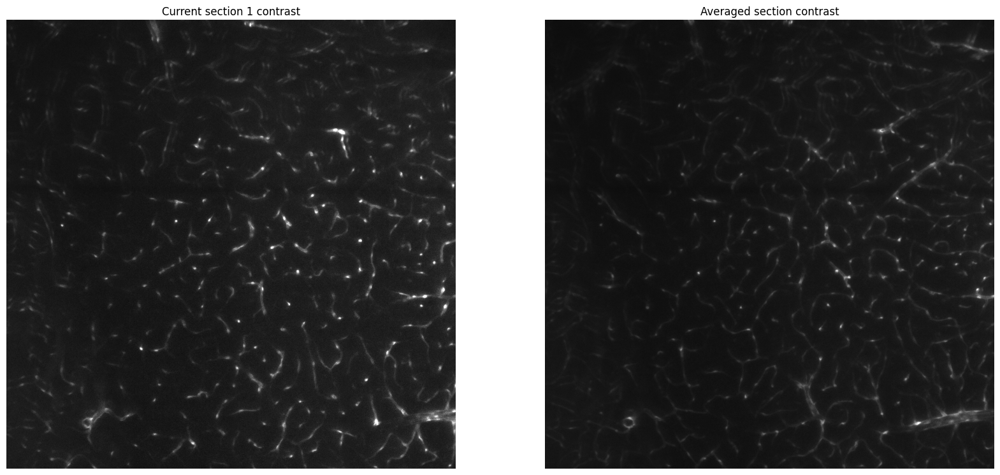

In [5]:
curr_img = images[0]
gamma = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha = 0.5  # Try 0.15 You can adjust this value to control the brightness enhancement
xlim = [9000, 10000]  # 8000, 9000 or 9000, 10000
ylim = [8000, 9000]  # 8000, 9000

# Compute the original image contrast
image_enhanced = gamma_correction(curr_img, gamma=gamma)
contrast_image1 = auto_contrast(image_enhanced, alpha=contrast_alpha)

# Compute the average image contrast
curr_average = compute_average_image(images)
image_enhanced = gamma_correction(curr_average, gamma=gamma)
contrast_image2 = auto_contrast(image_enhanced, alpha=contrast_alpha)

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(contrast_image1, cmap='gray')
plt.title("Current section 1 contrast")
plt.axis('off')
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(contrast_image2, cmap='gray')
plt.title("Averaged section contrast")
plt.axis('off')
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

## Hessian Filter
https://examples.itk.org/src/nonunit/review/segmentbloodvesselswithmultiscalehessianbasedmeasure/documentation

In [ ]:
import itk
import numpy as np
from skimage.morphology import remove_small_objects, binary_closing, disk, remove_small_holes


def detect_vessels(input_image: np.ndarray, min_sigma: float=1.0, max_sigma: float=10.0, num_steps: int=10):
    # Run ITK
    input_image = itk.image_from_array(input_image)
    #input_image = itk.imread(input_image, itk.F)

    ImageType = type(input_image)
    Dimension = input_image.GetImageDimension()
    HessianPixelType = itk.SymmetricSecondRankTensor[itk.D, Dimension]
    HessianImageType = itk.Image[HessianPixelType, Dimension]

    objectness_filter = itk.HessianToObjectnessMeasureImageFilter[
        HessianImageType, ImageType
    ].New()
    objectness_filter.SetBrightObject(False)  # Set to True if the structures are bright on a dark background
    objectness_filter.SetScaleObjectnessMeasure(False)  # Set to True to scale the objectness measure by the scale
    objectness_filter.SetAlpha(0.5)  # Sensitivity to blob-like structures
                                     # Set/Get Alpha, the weight corresponding to R_A 
                                     # (the ratio of the smallest eigenvalue that has to be large to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetBeta(1.0)   # Sensitivity to plate-like structures
                                     # Set/Get Beta, the weight corresponding to R_B 
                                     # (the ratio of the largest eigenvalue that has to be small to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetGamma(5.0)  # Sensitivity to noise
                                     # Set/Get Gamma, the weight corresponding to S 
                                     # (the Frobenius norm of the Hessian matrix, or second-order structureness)

    multi_scale_filter = itk.MultiScaleHessianBasedMeasureImageFilter[
        ImageType, HessianImageType, ImageType
    ].New()
    multi_scale_filter.SetInput(input_image)
    multi_scale_filter.SetHessianToMeasureFilter(objectness_filter)
    multi_scale_filter.SetSigmaStepMethodToLogarithmic()
    multi_scale_filter.SetSigmaMinimum(min_sigma)
    multi_scale_filter.SetSigmaMaximum(max_sigma)
    multi_scale_filter.SetNumberOfSigmaSteps(num_steps)

    OutputPixelType = itk.UC
    OutputImageType = itk.Image[OutputPixelType, Dimension]

    rescale_filter = itk.RescaleIntensityImageFilter[ImageType, OutputImageType].New()
    rescale_filter.SetInput(multi_scale_filter)
    rescale_filter.Update()

    # Get numpy array
    segmented_vessels = rescale_filter.GetOutput()
    segmented_vessels_array = itk.array_view_from_image(segmented_vessels)
    segmented_vessels_array = np.asarray(segmented_vessels_array, dtype=np.float32)
    return segmented_vessels_array


def process_vessels(vessel_image: np.ndarray, thresh: int, min_size: int=10, smoothing: int=3):
    # Process the thresholded vessels
    thresholded_vessels = vessel_image > thresh
    thresholded_vessels = np.invert(thresholded_vessels)

    # Get rid of small objects
    thresholded_vessels = remove_small_objects(thresholded_vessels, min_size=min_size)

    # Smoothen edges
    thresholded_vessels = binary_closing(thresholded_vessels, footprint=disk(smoothing))
    
    return thresholded_vessels


from skimage.measure import label   

def get_mask(brain_image, thresh=255, area_threshold=300000):
    """
    Get the mask of the brain from the image.
    
    Args:
        brain_image: np.ndarray, input image
        thresh: int, threshold value
        area_threshold: int, area threshold
        
    Returns:
        mask: np.ndarray, mask of the brain
    """
    _, th1 = cv2.threshold(brain_image, thresh, 65535, cv2.THRESH_BINARY)
    mask = remove_small_holes(th1.astype(bool), area_threshold=area_threshold)
    labels = label(mask)
    assert( labels.max() != 0 ) # assume at least 1 CC
    largestCC = labels == np.argmax(np.bincount(labels.flat)[1:])+1
    return largestCC


Input image type: float32
Input image min: 2805.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (1000, 1000)
Min: 0.0
Max: 255.0
Mean: 226.77048
Median: 254.0
Std: 71.67004


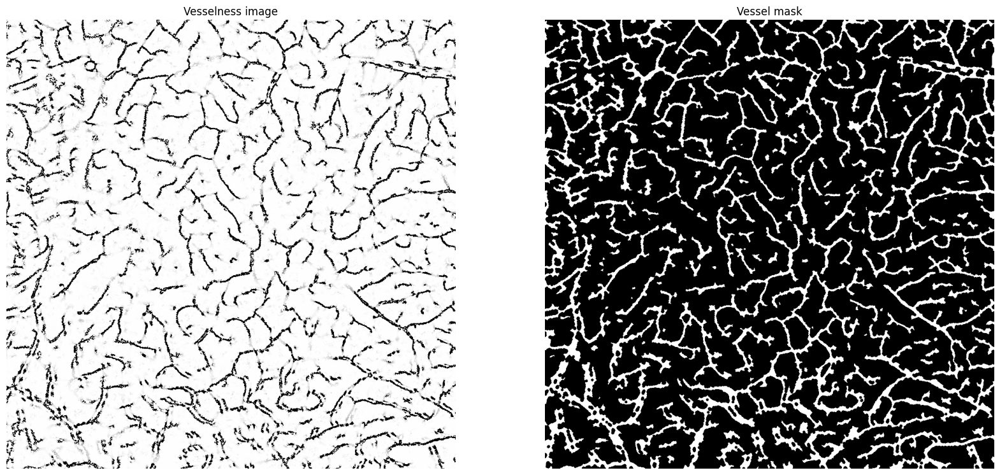

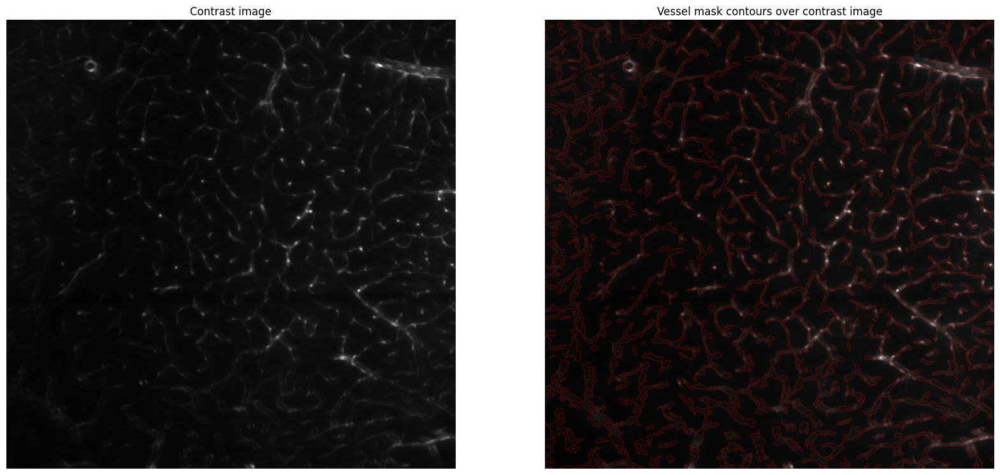

In [7]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0
number_of_sigma_steps = 10  # Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 10  # Minimum size of objects to keep
smoothing = 3  # Smoothing factor for closing, 3

#############################################################

# Load the image slice
input_image = "slice.png"
input_image = itk.imread(input_image, itk.F)
input_image = itk.array_from_image(input_image)

# Alternative: load image in memory
input_image = contrast_image2[ylim[0]:ylim[1], xlim[0]:xlim[1]]
input_image = input_image.astype(np.float32)
input_image *= 255.0

# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, smoothing=smoothing)

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
print("Std:", segmented_vessels_array.std())

# Plot the raw vesselness image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("Vesselness image")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels, cmap='gray')
plt.axis('off')
plt.title("Vessel mask")
plt.show()

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("Contrast image")

plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("Vessel mask contours over contrast image")
plt.show()

Input image type: float32
Input image min: 0.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (14233, 12249)
Min: 0.0
Max: 255.0
Mean: 170.35349
Median: 249.0
Std: 111.38401


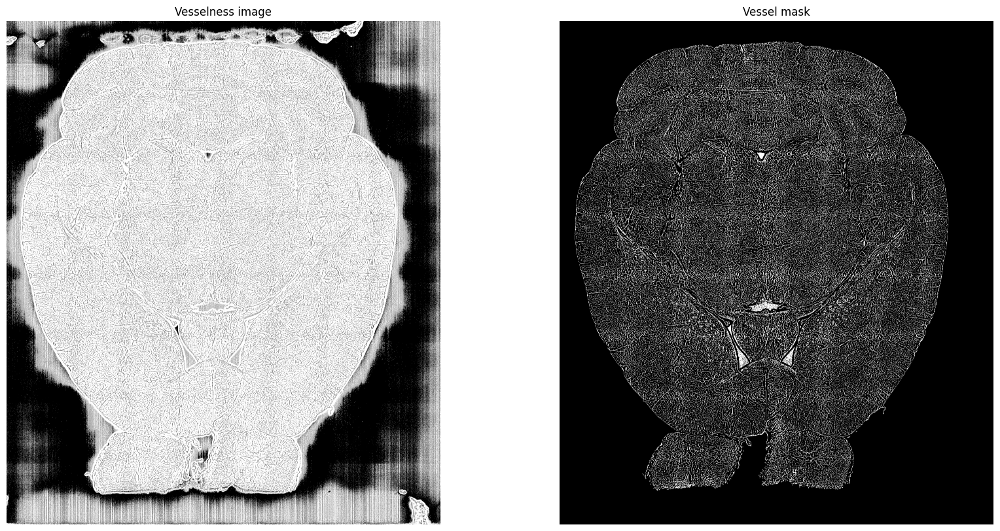

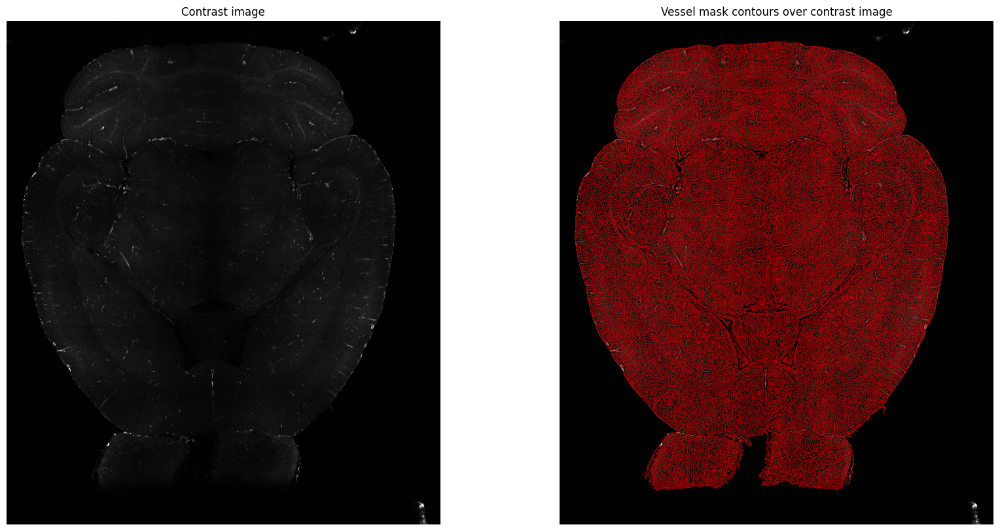

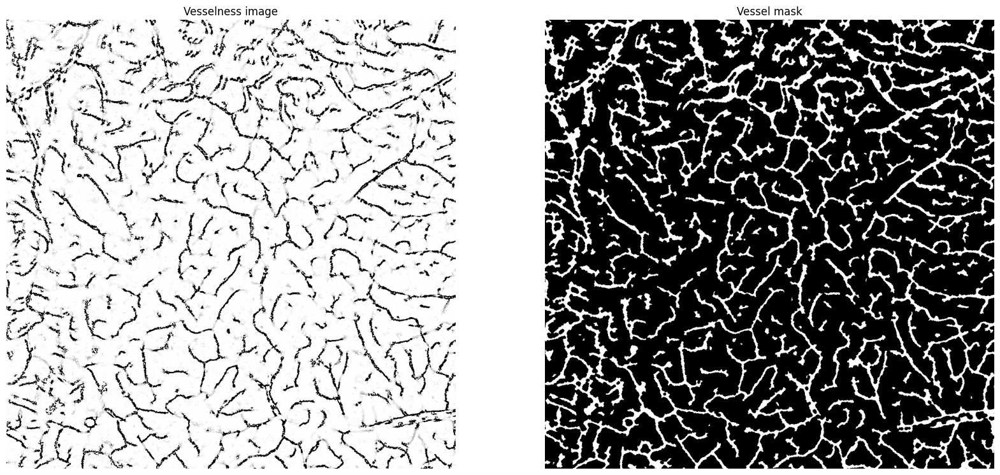

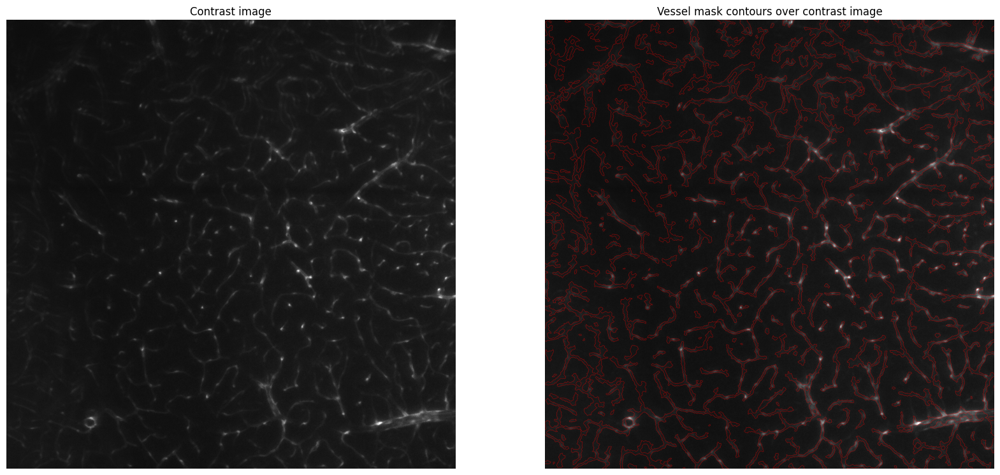

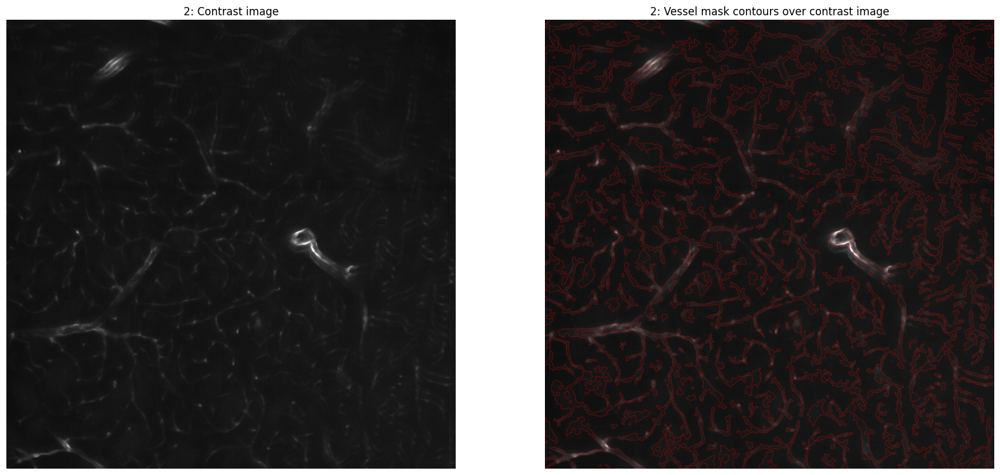

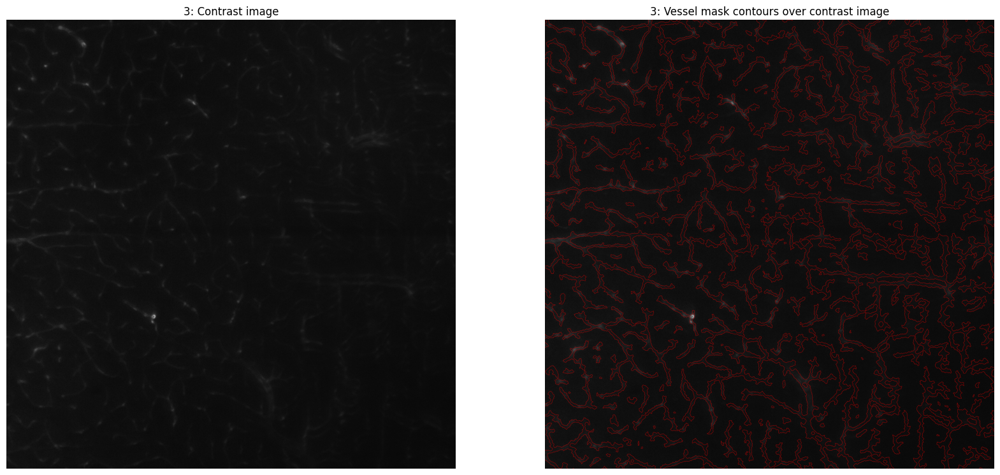

In [8]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0
number_of_sigma_steps = 10  # Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 10  # Minimum size of objects to keep
smoothing = 3  # Smoothing factor for closing, 3

#############################################################

# Load the image slice
input_image = "slice.png"
input_image = itk.imread(input_image, itk.F)
input_image = itk.array_from_image(input_image)

# Alternative: load image in memory
input_image = contrast_image2
input_image = input_image.astype(np.float32)
input_image *= 255.0
bg_mask = get_mask(curr_average, thresh=255, area_threshold=300000)  # 255 default ch0, 150 for ch1


# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, smoothing=smoothing)

# Apply mask to the thresholded vessels
thresholded_vessels = np.logical_and(thresholded_vessels, bg_mask)

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
print("Std:", segmented_vessels_array.std())

# Plot the raw vesselness image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("Vesselness image")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels, cmap='gray')
plt.axis('off')
plt.title("Vessel mask")
plt.show()

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("Contrast image")
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("Vessel mask contours over contrast image")
plt.show()

# Plot the raw vesselness image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("Vesselness image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels, cmap='gray')
plt.axis('off')
plt.title("Vessel mask")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("Contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("Vessel mask contours over contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("2: Contrast image")
plt.xlim(ylim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("2: Vessel mask contours over contrast image")
plt.xlim(ylim)
plt.ylim(ylim)
plt.show()

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("3: Contrast image")
plt.xlim([4000, 5000])
plt.ylim([4000, 5000])
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("3: Vessel mask contours over contrast image")
plt.xlim([4000, 5000])
plt.ylim([4000, 5000])
plt.show()



In [9]:
#np.save("thresholded_vessels_ch0.npy", thresholded_vessels)

In [ ]:
def dice_coefficient(binary_image1, binary_image2):
    """
    Compute the Dice coefficient between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - dice: Dice coefficient.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    size1 = np.sum(binary_image1)
    size2 = np.sum(binary_image2)
    
    dice = (2. * intersection) / (size1 + size2)
    return dice


def iou(binary_image1, binary_image2):
    """
    Compute the Intersection over Union (IoU) between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - iou: IoU.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    union = np.sum(binary_image1 + binary_image2)
    
    iou = intersection / union
    return iou


def precision(binary_image1, binary_image2):
    """
    Compute the precision between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - precision: Precision.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    
    precision = true_positives / (true_positives + false_positives)
    return precision


def recall(binary_image1, binary_image2):
    """
    Compute the recall between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - recall: Recall.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    
    recall = true_positives / (true_positives + false_negatives)
    return recall


def rand_index(binary_image1, binary_image2):
    """
    Compute the Rand index between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - rand_index: Rand index.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    true_negatives = np.sum((1 - binary_image1) * (1 - binary_image2))
    
    rand_index = (true_positives + true_negatives) / (true_positives + false_positives + false_negatives + true_negatives)
    return rand_index


thresholded_ch0 = np.load("thresholded_vessels_ch0.npy")
thresholded_ch1 = np.load("thresholded_vessels_ch1.npy")

# Compute the Dice coefficient
dice_score = dice_coefficient(thresholded_ch0, thresholded_ch1)  
iou_score = iou(thresholded_ch0, thresholded_ch1)  # Strongly penalizes over-segmentation and under-segmentation
rand_score = rand_index(thresholded_ch0, thresholded_ch1)  # Measures how close points are clustered together
precision_score = precision(thresholded_ch0, thresholded_ch1) 
recall_score = recall(thresholded_ch0, thresholded_ch1) 
print("Dice coefficient:", dice_score)
print("IoU score:", iou_score)
print("Rand index:", rand_score)
print("Precision score:", precision_score)
print("Recall score:", recall_score)

Dice coefficient: 0.7403909334449043
IoU score: 0.5877942237029138
Rand index: 0.9356728122838258
Precision score: 0.7171829033899441
Recall score: 0.7651512175647518
